# Car Price prediction
Суть проекта —  создать модель, которая будет предсказывать стоимость автомобиля по его характеристикам.
Если модель работает хорошо, то она сможет быстро выявлять выгодные предложения (когда желаемая цена продавца ниже предсказанной рыночной цены).

## Install Libraries

In [32]:
#!pip install pandas_profiling

## Import Libraries

In [140]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling
from sklearn.feature_selection import f_classif, mutual_info_classif
from sklearn.preprocessing import StandardScaler, LabelEncoder, OrdinalEncoder
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from catboost import CatBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import (RandomForestRegressor, ExtraTreesRegressor, AdaBoostRegressor,
                              GradientBoostingRegressor, BaggingRegressor, StackingRegressor)
from sklearn.linear_model import LinearRegression

In [34]:
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

## Declare constants

In [110]:
DATA_DIR = './data/'  # directory with data
RANDOM_SEED = 42 # fix random
TEST_SIZE = 0.2 # size test data
RUB_USD_RATE = 0.75

## Declare classes

In [36]:
# DataAnalysis class provides a list of methods for data analysis
class EDA():

    def __init__(self, data, description):
        self.data = data  # data for analysis
        self.description = description  # brief data description

    # provide info about data
    def basic_info(self):
        self.display("Preview")
        display(self.data.sample(5))  # data preview

        self.display("Info")
        self.data.info()  # data info

        print('\n')
        print('Shape: {}'.format(self.data.shape))

        for column in self.data.columns:
            self.null_values_info(column)

    # do primary data analysis
    def primary_analysis(self):
        display(pandas_profiling.ProfileReport(self.data))

    # get info about column with null values
    def null_info(self, column):
        display(self.data[column].value_counts(dropna=False))
        mode = self.data[column].mode()[0]
        print('{} mode is \033[1m{}\033[0m'.format(column, mode))

    # get percent of null values in column
    def null_values_info(self, column):
        nanPercent = len(self.data[self.data[column].isnull()])/len(self.data)
        print('Percent nullable records in \033[1m{}\033[0m column: {:2.1%}'.format(
            column, nanPercent))
        return nanPercent

    # get outliers info
    def outlier_info(self, column):
        IQR = self.data[column].quantile(
            0.75) - self.data[column].quantile(0.25)
        perc25 = self.data[column].quantile(0.25)
        perc75 = self.data[column].quantile(0.75)

        ds = self.data.loc[self.data[column].between(
            perc25 - 1.5*IQR, perc75 + 1.5*IQR)]
        totalCount = len(self.data)
        outlierCount = totalCount - len(ds)

        print('\033[1mCOLUMN: {} \033[0m'.format(column))
        print('25%: {}.'.format(perc25))
        print('75%: {}.'.format(perc75))
        print('IQR: {}.'.format(IQR))
        print('Outlier ranges: [{f}, {l}].'.format(
            f=perc25 - 1.5*IQR, l=perc75 + 1.5*IQR))
        print('\033[1mOutlier count: {} from {} ({:.0%}).\033[0m'.format(
            outlierCount, totalCount, outlierCount/totalCount))
        print('\n')

    # do variance analysis for numeric variables
    def numeric_variance_analysis(self, columns):
        imp_num = pd.Series(
            f_classif(self.data[columns], self.data['train'])[0], index=columns)
        imp_num.sort_values(inplace=True)
        imp_num.plot(kind='barh', color='turquoise')

    # do variance analysis for string variables
    def variance_analysis(self, columns):
        imp_num = pd.Series(mutual_info_classif(self.data[columns], self.data['train'],
                                                discrete_features=True), index=columns)
        imp_num.sort_values(inplace=True)
        imp_num.plot(kind='barh', color='turquoise')

    # Student test
    def get_stat_dif(self, columns):
        for column in columns:
            cols = self.data.loc[:, column].value_counts().index[:10]
            combinations_all = list(combinations(cols, 2))

            if len(combinations_all) == 0:
                break

            for comb in combinations_all:
                if ttest_ind(self.data.loc[df.loc[:, column] == comb[0], 'train'],
                             self.data.loc[df.loc[:, column] == comb[1], 'train']). pvalue\
                        <= 0.1/len(combinations_all):
                    print('Exist stat significant differences for column ', column)
                    break

    # print text
    def display(self, text):
        print('\033[1m--- {}: {} ---\033[0m'.format(self.description.upper(), text))

In [37]:
# DataProcessing class provides a list of methods for data preprocessing
class DataProcessing():
    def __init__(self, data):
        self.data = data  # data for preprocessing

    # replace null values in column
    def fillna(self, column, value):
        self.data[column].fillna(value, inplace=True)

    # replace outlets with top quantile
    def outlets_resolve(self, column):  # quant=0.25 or 0.75
        IQR = self.data[column].quantile(
            q=0.75) - self.data[column].quantile(0.25)
        perc75 = self.data[column].quantile(0.75)
        high_border = perc75 + 1.5*IQR
        self.data[column] = self.data[column].apply(
            lambda x: high_border if x > high_border else x)

    # log transformation
    def log_transform(self, columns):
        for column in columns:
            self.data[column] = self.data[column].apply(lambda x: np.log(x+1))
            plt.figure()
            sns.histplot(self.data[column], kde=True,
                         stat="density", linewidth=0)

    # date processing
    def date_process(self, column):
        # convert to datetime
        self.data[column] = pd.to_datetime(self.data[column])

        # feature engineering
        self.data[column + '_year'] = self.data[column].apply(lambda x: x.year)
        self.data[column +
                  '_month'] = self.data[column].apply(lambda x: x.month)
        self.data[column + '_day'] = self.data[column].apply(lambda x: x.day)

        # drop original column
        self.data.drop([column], axis=1, inplace=True)

    # standard scaler for numeric variables
    def standard_scale(self, columns):
        self.data[columns] = pd.DataFrame(
            StandardScaler().fit_transform(self.data[columns]), columns=columns)
        for column in columns:
            plt.figure()
            sns.histplot(self.data[column], kde=True,
                         stat="density", linewidth=0)

    # label encoder for string variables
    def label_encode(self, columns):
        for column in columns:
            self.data[column] = LabelEncoder().fit_transform(self.data[column])

    # ordinal encoder for string variables
    def ordinal_encode(self, columns):
        self.data[columns] = OrdinalEncoder().fit_transform(
            self.data[columns]).astype(int)

    # get dummies data
    def get_dummies(self, columns):
        return pd.get_dummies(self.data, columns=columns)

## Declare functions

In [38]:
# calculate mape    
def mape(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    res = np.mean(np.abs((y_true - y_pred)/y_true))
    print(f"Model Accuracy: MAPE: {res*100:0.2f}%")
    return

### 1.1 Analyse Test data

In [39]:
# test data
test = pd.read_csv(DATA_DIR + 'test.csv') 
# sample_submission data / results
submission = pd.read_csv(DATA_DIR + 'submission.csv')

#### 1.1.1 Basic Test data info

In [40]:
eda_test = EDA(test, 'test data')
eda_test.basic_info()

--- TEST DATA: Preview ---


,bodyType,brand,car_url,color,complectation_dict,description,engineDisplacement,enginePower,equipment_dict,fuelType,...,vehicleConfiguration,vehicleTransmission,vendor,Владельцы,Владение,ПТС,Привод,Руль,Состояние,Таможня
28399,седан,MITSUBISHI,https://auto.ru/cars/used/sale/mitsubishi/lanc...,чёрный,"{""id"":""7685466"",""name"":""Invite+"",""available_op...",Причина продажи — нужен новый ASX (семья увели...,1.6 LTR,117 N12,"{""engine-proof"":true,""tinted-glass"":true,""airb...",бензин,...,SEDAN MECHANICAL 1.6,механическая,JAPANESE,3 или более,2 года и 6 месяцев,Дубликат,передний,Левый,Не требует ремонта,Растаможен
22068,хэтчбек 5 дв.,TOYOTA,https://auto.ru/cars/used/sale/toyota/auris/11...,чёрный,NaN,"Машина выходного дня, поездки за город, косяки...",1.6 LTR,124 N12,NaN,бензин,...,HATCHBACK_5_DOORS ROBOT 1.6,роботизированная,JAPANESE,3 или более,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
23282,седан,VOLKSWAGEN,https://auto.ru/cars/used/sale/volkswagen/pass...,белый,NaN,。Преднатяжители ремней безопасности\n。Креплени...,1.8 LTR,152 N12,"{""cruise-control"":true,""asr"":true,""esp"":true,""...",бензин,...,SEDAN ROBOT 1.8,роботизированная,EUROPEAN,1 владелец,NaN,Оригинал,передний,Левый,Не требует ремонта,Растаможен
24833,хэтчбек 5 дв.,VOLKSWAGEN,https://auto.ru/cars/used/sale/volkswagen/golf...,голубой,NaN,Безопасность: 15. Салон: 12. Мультимедиа: 5. О...,1.2 LTR,105 N12,"{""asr"":true,""tinted-glass"":true,""esp"":true,""us...",бензин,...,HATCHBACK_5_DOORS ROBOT 1.2,роботизированная,EUROPEAN,3 или более,1 год и 11 месяцев,Оригинал,передний,Левый,Не требует ремонта,Растаможен
31067,лифтбек,SKODA,https://auto.ru/cars/used/sale/skoda/octavia/1...,жёлтый,"{""id"":""20803495"",""name"":""Active"",""available_op...","Машина в одних руках, в хорошем состоянии. Тор...",1.6 LTR,110 N12,"{""asr"":true,""tinted-glass"":true,""esp"":true,""ec...",бензин,...,LIFTBACK AUTOMATIC 1.6,автоматическая,EUROPEAN,1 владелец,3 года и 10 месяцев,Оригинал,передний,Левый,Не требует ремонта,Растаможен


--- TEST DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686 entries, 0 to 34685
Data columns (total 32 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   bodyType              34686 non-null  object
 1   brand                 34686 non-null  object
 2   car_url               34686 non-null  object
 3   color                 34686 non-null  object
 4   complectation_dict    6418 non-null   object
 5   description           34686 non-null  object
 6   engineDisplacement    34686 non-null  object
 7   enginePower           34686 non-null  object
 8   equipment_dict        24690 non-null  object
 9   fuelType              34686 non-null  object
 10  image                 34686 non-null  object
 11  mileage               34686 non-null  int64 
 12  modelDate             34686 non-null  int64 
 13  model_info            34686 non-null  object
 14  model_name            34686 non-null  object
 15  name        

#### 1.1.2 Basic Submission data info

In [41]:
eda_submission = EDA(submission, 'submission')
eda_submission.basic_info()

--- SUBMISSION: Preview ---


,sell_id,price
25789,1100845176,18.704689
9211,1082541234,19.396868
401,1101300253,18.146418
27839,1100229836,17.286610
16601,1101285731,19.405999


--- SUBMISSION: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686 entries, 0 to 34685
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   sell_id  34686 non-null  int64  
 1   price    34686 non-null  float64
dtypes: float64(1), int64(1)
memory usage: 542.1 KB


Shape: (34686, 2)
Percent nullable records in sell_id column: 0.0%
Percent nullable records in price column: 0.0%


#### 1.1.3 Summary  
В тестовом dataset порядка 34 тысяч записей

### 1.2 Analyse AutoRu data

In [42]:
# Extra cars data
data_extra = pd.read_csv(DATA_DIR + 'autoru_cars.csv')

#### 1.2.1 Basic AutoRu data info

In [43]:
eda_extra = EDA(data_extra, 'extra data')
eda_extra.basic_info()

--- EXTRA DATA: Preview ---


,Unnamed: 0,test,style,body,color,fuel,model_date,doors,production_date,transmission,...,vehicle_title,description,features,ownership,price,url,custom,catalog_url,brand,generation
5788,6103,0,1.6 AT (110 л.с.),седан,бежевый,Бензин,2014.0,5,2017.0,автоматическая,...,Оригинал,-Приобретался у официального дилера-1 владелец...,"['Стальные диски', 'Подушка безопасности водит...",NaN,780000,https://auto.ru/cars/used/sale/volkswagen/polo...,Растаможен,https://auto.ru/catalog/cars/volkswagen/polo/2...,volkswagen,5 поколение рестайлинг
54637,57044,0,2.0 CVT (150 л.с.) 4WD,внедорожник,белый,Бензин,2011.0,5,2012.0,вариатор,...,Оригинал,Автомобиль в отличном техническом состоянии. Б...,"['Круиз-контроль', 'Электростеклоподъёмники пе...",2 года и 7 месяцев,965000,https://auto.ru/cars/used/sale/subaru/xv/10928...,Растаможен,https://auto.ru/catalog/cars/subaru/xv/7892300...,subaru,1 поколение
12976,13553,0,3.6d AT (272 л.с.) 4WD,внедорожник,чёрный,Дизель,2005.0,5,2007.0,автоматическая,...,Оригинал,Автомобиль полностью обслужен. Звоните с 10:00...,"['Круиз-контроль', 'Электрорегулировка руля', ...",10 месяцев,750000,https://auto.ru/cars/used/sale/land_rover/rang...,Растаможен,https://auto.ru/catalog/cars/land_rover/range_...,land_rover,3 поколение рестайлинг
1007,1063,0,3.0d AT (240 л.с.) 4WD,внедорожник,серый,Дизель,2007.0,5,2010.0,автоматическая,...,Оригинал,Продаётся очень надёжный и экономичный Автомоб...,"['Круиз-контроль', 'Мультифункциональное рулев...",10 лет и 2 месяца,950000,https://auto.ru/cars/used/sale/volkswagen/toua...,Растаможен,https://auto.ru/catalog/cars/volkswagen/touare...,volkswagen,1 поколение рестайлинг
30566,31879,0,1.6 MT (122 л.с.),хэтчбек,чёрный,Бензин,2006.0,5,2010.0,механическая,...,Оригинал,NaN,"['Тонированные стекла', 'Передний центральный ...",NaN,390000,https://auto.ru/cars/used/sale/kia/ceed/109937...,Растаможен,https://auto.ru/catalog/cars/kia/ceed/2307183/...,kia,1 поколение


--- EXTRA DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61260 entries, 0 to 61259
Data columns (total 27 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Unnamed: 0           61260 non-null  int64  
 1   test                 61260 non-null  int64  
 2   style                61260 non-null  object 
 3   body                 61260 non-null  object 
 4   color                61260 non-null  object 
 5   fuel                 61260 non-null  object 
 6   model_date           59518 non-null  float64
 7   doors                61260 non-null  int64  
 8   production_date      61260 non-null  float64
 9   transmission         61260 non-null  object 
 10  engine_displacement  61200 non-null  float64
 11  engine_power         61260 non-null  int64  
 12  mileage              61260 non-null  int64  
 13  drive_type           61260 non-null  object 
 14  wheel                61260 non-null  object 
 15  condition  

#### 1.2.2 Summary  
В тестовом dataset порядка 61 тысяч записей  
23 колонки в Extra совпадают по содержимому с тестовым dataset

### 1.3 Data Preprocessing

#### 1.3.1 Processing Extra dataset 

In [44]:
# Rename columns
data_extra.rename(columns={
    'ulr': 'car_url'
}, inplace=True)

In [45]:
# Create columns
data_extra["sell_id"] = 0
data_extra["features_count"] = data_extra["features"].apply(lambda x: len(x))

In [46]:
# Drop columns
data_extra.drop(['Unnamed: 0', 'test', 'features', 'generation'], axis=1, inplace=True)

In [47]:
# Info
data_extra.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61260 entries, 0 to 61259
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   style                61260 non-null  object 
 1   body                 61260 non-null  object 
 2   color                61260 non-null  object 
 3   fuel                 61260 non-null  object 
 4   model_date           59518 non-null  float64
 5   doors                61260 non-null  int64  
 6   production_date      61260 non-null  float64
 7   transmission         61260 non-null  object 
 8   engine_displacement  61200 non-null  float64
 9   engine_power         61260 non-null  int64  
 10  mileage              61260 non-null  int64  
 11  drive_type           61260 non-null  object 
 12  wheel                61260 non-null  object 
 13  condition            61260 non-null  object 
 14  owners               61260 non-null  object 
 15  vehicle_title        61260 non-null 

#### 1.3.2 Processing Test dataset 

In [48]:
# Rename columns
test.rename(columns={
    'bodyType': 'body',
    'fuelType': 'fuel',
    'modelDate': 'model_date',
    'numberOfDoors': 'doors',
    'productionDate': 'production_date',
    'vehicleTransmission': 'transmission',
    'name': 'style',
    'Владение': 'ownership',
    'ПТС': 'vehicle_title',
    'Владельцы': 'owners',
    'Таможня': 'custom',
    'Руль': 'wheel',
    'Привод': 'drive_type',
    'Состояние': 'condition'
}, inplace=True)

In [49]:
# Create columns
test['price'] = 0
test['engine_power'] = test['enginePower'].apply(lambda x: str(x).replace(' N12','')).astype(int)
test['engine_displacement'] = test['engineDisplacement'].apply(lambda x: '0' if str(x).replace(' LTR','') == '' else str(x).replace(' LTR','')).astype(float)
test["features_count"] = test["equipment_dict"].apply(lambda x: len(x.split('","')) if isinstance(x, str) else 0).astype(int)

In [50]:
# Drop columns
test.drop(['complectation_dict', 'equipment_dict', 'image', 'model_info',
               'parsing_unixtime', 'priceCurrency', 'super_gen', 'vehicleConfiguration', 'vendor', 'enginePower', 'engineDisplacement'], axis=1, inplace=True)

In [51]:
# Info
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34686 entries, 0 to 34685
Data columns (total 25 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   body                 34686 non-null  object 
 1   brand                34686 non-null  object 
 2   car_url              34686 non-null  object 
 3   color                34686 non-null  object 
 4   description          34686 non-null  object 
 5   fuel                 34686 non-null  object 
 6   mileage              34686 non-null  int64  
 7   model_date           34686 non-null  int64  
 8   model_name           34686 non-null  object 
 9   style                34686 non-null  object 
 10  doors                34686 non-null  int64  
 11  production_date      34686 non-null  int64  
 12  sell_id              34686 non-null  int64  
 13  transmission         34686 non-null  object 
 14  owners               34686 non-null  object 
 15  ownership            11995 non-null 

#### 1.3.3 Combine Extra and Test datasets

In [52]:
data_extra['train'] = bool(1)
test['train'] = bool(0)

data = pd.concat([data_extra, test], join='inner', ignore_index=True)

### 1.4 Basic info

In [53]:
eda = EDA(data, 'data')
eda.basic_info()

--- DATA: Preview ---


,style,body,color,fuel,model_date,doors,production_date,transmission,engine_displacement,engine_power,...,owners,vehicle_title,description,ownership,price,custom,brand,sell_id,features_count,train
56709,2.0 AMT (230 л.с.),лифтбек,серебристый,Бензин,2017.0,5,2017.0,роботизированная,2.0,230,...,1 владелец,Оригинал,"Продаю Рску , была в одних руках на ооо Фолькс...",NaN,1650000,Растаможен,skoda,0,2,True
78638,350 CDI BlueTEC 3.0d AT (249 л.с.) 4WD,внедорожник 5 дв.,серый,дизель,2012.0,5,2015.0,автоматическая,3.0,249,...,1 владелец,Оригинал,GL 350 2015 г.в. Пакет AMG полная комплектация...,5 лет и 6 месяцев,0,Растаможен,MERCEDES,1101158820,0,False
13530,2.7d AT (190 л.с.) 4WD,внедорожник,чёрный,Дизель,2004.0,7,2006.0,автоматическая,2.7,190,...,3 или более,Оригинал,"Автомобиль в очень хорошем состоянии,стоит нов...",NaN,650000,Растаможен,land_rover,0,2,True
68237,2.4d AT (215 л.с.) 4WD,универсал 5 дв.,коричневый,дизель,2007.0,5,2012.0,автоматическая,2.4,215,...,3 или более,Оригинал,"Авто на отличном ходу, любые проверки, хоть у ...",4 года и 7 месяцев,0,Растаможен,VOLVO,1101244152,1,False
53311,1.6 AT (120 л.с.),седан,серебристый,Бензин,2012.0,5,2012.0,автоматическая,1.6,120,...,1 владелец,Оригинал,Продам в хорошие руки серебристый пежо,NaN,560000,Растаможен,peugeot,0,2,True


--- DATA: Info ---
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 95946 entries, 0 to 95945
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   style                95946 non-null  object 
 1   body                 95946 non-null  object 
 2   color                95946 non-null  object 
 3   fuel                 95946 non-null  object 
 4   model_date           94204 non-null  float64
 5   doors                95946 non-null  int64  
 6   production_date      95946 non-null  float64
 7   transmission         95946 non-null  object 
 8   engine_displacement  95886 non-null  float64
 9   engine_power         95946 non-null  int64  
 10  mileage              95946 non-null  int64  
 11  drive_type           95946 non-null  object 
 12  wheel                95946 non-null  object 
 13  condition            95946 non-null  object 
 14  owners               95946 non-null  object 
 15  vehicle_title    

**SUMMARY:**    
1. **ownership** column has many null values.

### 1.5 Primary data analysis

In [54]:
eda.primary_analysis()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**SUMMARY: Primary Data Analysis**    
1 The dataset contains: 9 - numeric, 14 - categorical and 1 - boolean variables   
2 There is no duplicates in the dataset  
3 **ownership**  has 62% null values  
4 High corellation between **model_date**, **production_date** and **mileage** variables  
5 High corellation between **engine_power** and **engine_displacement** variables

#### 1.5.1  Split columns by types

In [55]:
cat_columns = ['style', 'body', 'color', 'fuel', 'transmission', 'drive_type', 'wheel', 'condition', 'owners', 'vehicle_title', 'description', 'ownership', 'custom', 'brand']  # categorical variables
num_columns = [ 'doors', 'production_date', 'engine_displacement', 'engine_power', 'mileage', 'features_count']  # numeric variables
help_columns = ['train', 'sell_id']
target_column = ['price']

### 2  Data Cleanup

### 2.1 "ownership" column

In [56]:
eda.null_info('ownership')

NaN                    59525
1 год и 10 месяцев       609
1 год и 11 месяцев       590
1 год и 9 месяцев        584
11 месяцев               564
                       ...  
21 год и 11 месяцев        1
18 лет и 5 месяцев         1
19 лет и 3 месяца          1
19 лет и 9 месяцев         1
25 лет и 6 месяцев         1
Name: ownership, Length: 292, dtype: int64

ownership mode is 1 год и 10 месяцев


**TODO**: As we know **production_date** we can remove **ownership** column, because there is 62% of null values.

In [57]:
data.drop(columns=['ownership'], inplace=True)

### 2.2 "style" column

In [58]:
data["style"].unique()

array(['1.6 MT (105 л.с.)\xa0', '3.6 AT (280 л.с.) 4WD\xa0',
       '1.2 MT (86 л.с.)\xa0', ...,
       'Arctic Trucks AT38 2.8d AT (177 л.с.) 4WD',
       '2.0 MT (151 л.с.) 4WD', '300 3.0 AT (218 л.с.)'], dtype=object)

**TODO**: Let's remove the column, as it contains mixed info, that is presented in other columns.

In [59]:
data.drop(columns=['style'], inplace=True)

### 2.3 "body" column

In [60]:
data["body"].unique()

array(['седан', 'внедорожник', 'компактвэн', 'минивэн', 'хэтчбек',
       'универсал', 'пикап', 'фургон', 'купе', 'кабриолет', 'фастбек',
       'микровэн', 'лифтбек', 'родстер', 'купе-хардтоп', 'лимузин',
       'внедорожник 5 дв.', 'хэтчбек 5 дв.', 'универсал 5 дв.',
       'пикап одинарная кабина', 'хэтчбек 3 дв.', 'пикап двойная кабина',
       'внедорожник 3 дв.', 'седан 2 дв.', 'тарга',
       'внедорожник открытый', 'пикап полуторная кабина', 'седан-хардтоп'],
      dtype=object)

**TODO**: Let's remove doors info

In [61]:
data["body"] = data["body"].apply(lambda x: x.lower().split()[0].strip() if isinstance(x, str) else x)
data["body"].value_counts(normalize=True)

седан            0.377629
внедорожник      0.326329
хэтчбек          0.116222
лифтбек          0.051644
универсал        0.041461
минивэн          0.030403
компактвэн       0.022940
купе             0.014925
пикап            0.007025
купе-хардтоп     0.004336
родстер          0.002501
фургон           0.002335
кабриолет        0.001751
микровэн         0.000188
седан-хардтоп    0.000125
лимузин          0.000115
фастбек          0.000052
тарга            0.000021
Name: body, dtype: float64

### 2.4 "color" column

In [62]:
data["color"].value_counts(dropna=False)

чёрный         26853
белый          17499
серебристый    12886
серый          11224
синий           8765
красный         4822
коричневый      4158
зелёный         2528
бежевый         2090
голубой         1467
пурпурный        826
жёлтый           823
золотистый       803
фиолетовый       697
оранжевый        480
розовый           25
Name: color, dtype: int64

**TODO**: Everything looks good

### 2.5 "fuel" column

In [63]:
data["fuel"].value_counts(dropna=False)

Бензин                                53145
бензин                                28601
Дизель                                 7146
дизель                                 5800
Бензин, газобаллонное оборудование      707
гибрид                                  223
Гибрид                                  182
Электро                                  60
электро                                  55
Газ                                       9
Газ, газобаллонное оборудование           7
газ                                       7
Дизель, газобаллонное оборудование        4
Name: fuel, dtype: int64

**TODO**: Switch to Lowercase

In [64]:
data["fuel"] = data["fuel"].apply(lambda x: str(x).lower())
data["fuel"].value_counts(dropna=False)

бензин                                81746
дизель                                12946
бензин, газобаллонное оборудование      707
гибрид                                  405
электро                                 115
газ                                      16
газ, газобаллонное оборудование           7
дизель, газобаллонное оборудование        4
Name: fuel, dtype: int64

### 2.6 "transmission" column

In [65]:
data["transmission"].value_counts(dropna=False)

автоматическая      51552
механическая        27517
роботизированная     8518
вариатор             8359
Name: transmission, dtype: int64

**TODO**: Everything looks good

### 2.7 "drive_type" column

In [66]:
data["drive_type"].value_counts(dropna=False)

передний    54500
полный      33587
задний       7859
Name: drive_type, dtype: int64

**TODO**: Everything looks good

### 2.8 "wheel" column

In [67]:
data["wheel"].value_counts(dropna=False)

Левый     93546
Правый     2400
Name: wheel, dtype: int64

**TODO**: Everything looks good

### 2.9 "condition" column

In [68]:
data["condition"].value_counts(dropna=False)

Не требует ремонта    95945
Битый / не на ходу        1
Name: condition, dtype: int64

**TODO**: Convert to binary type as there are only 2 values

In [69]:
data["condition"] = data["condition"].apply(lambda x: 1 if x == 'Не требует ремонта' else 0).astype(bool)

### 2.10 "owners" column

In [70]:
data["owners"].unique()

array(['2 владельца', '3 или более', '1 владелец', '1\xa0владелец',
       '2\xa0владельца'], dtype=object)

**TODO**: Replace \xa0 and convert to float

In [71]:
data["owners"] = data["owners"].apply(lambda x: x.replace('\xa0', ' ').split()[0] if isinstance (x, str) else x).astype(float)
data["owners"].value_counts(dropna=False)

3.0    42788
2.0    26944
1.0    26214
Name: owners, dtype: int64

### 2.11 "vehicle_title" column

In [72]:
data["vehicle_title"].value_counts(dropna=False)

Оригинал    84169
Дубликат    11776
NaN             1
Name: vehicle_title, dtype: int64

**TODO**: Convert to binary type

In [73]:
data["vehicle_title"] = data["vehicle_title"].apply(lambda x: 0 if x == 'Дубликат' else 1).astype(bool)

### 2.12 "description" column

**TODO**: Calculate words count in the column

In [74]:
data["description"] = data["description"].apply(lambda x: len(x) if isinstance(x, str) else x)
data["description"].value_counts(dropna=False)

NaN       2994
433.0      428
306.0      362
85.0       331
132.0      323
          ... 
7941.0       1
3449.0       1
3305.0       1
4951.0       1
2791.0       1
Name: description, Length: 3752, dtype: int64

**TODO**: Replace NaN with 0

In [75]:
data['description'] = data['description'].fillna(0)
data["description"].value_counts(dropna=False)

0.0       2994
433.0      428
306.0      362
85.0       331
132.0      323
          ... 
7941.0       1
3449.0       1
3305.0       1
4951.0       1
2791.0       1
Name: description, Length: 3752, dtype: int64

### 2.13 "custom" column

In [76]:
data["custom"].value_counts(dropna=False)

Растаможен    93128
NaN            2818
Name: custom, dtype: int64

**TODO**: Convert to binary type

In [77]:
data["custom"] = data["custom"].apply(lambda x: 1 if x == 'Растаможен' else 0).astype(bool)

In [78]:
data[data["train"]==0].custom.value_counts(dropna=False)

True    34686
Name: custom, dtype: int64

**SUMMARY**: Extra dataset contains only Custom=True data

## 3 Duplicates

In [79]:
data.shape

(95946, 22)

In [80]:
data.drop_duplicates(inplace=True)
data.shape

(95945, 22)

**SUMMARY**: One duplicate has been removed

## 4 Missed Values

In [81]:
for column in data.columns:
    misses = (1 - (data[column].count() / data.shape[0]))
    print('Процент пропусков в', column,': ', round(misses*100, 5), "%")

Процент пропусков в body :  0.0 %
Процент пропусков в color :  0.0 %
Процент пропусков в fuel :  0.0 %
Процент пропусков в model_date :  1.81562 %
Процент пропусков в doors :  0.0 %
Процент пропусков в production_date :  0.0 %
Процент пропусков в transmission :  0.0 %
Процент пропусков в engine_displacement :  0.06254 %
Процент пропусков в engine_power :  0.0 %
Процент пропусков в mileage :  0.0 %
Процент пропусков в drive_type :  0.0 %
Процент пропусков в wheel :  0.0 %
Процент пропусков в condition :  0.0 %
Процент пропусков в owners :  0.0 %
Процент пропусков в vehicle_title :  0.0 %
Процент пропусков в description :  0.0 %
Процент пропусков в price :  0.0 %
Процент пропусков в custom :  0.0 %
Процент пропусков в brand :  0.0 %
Процент пропусков в sell_id :  0.0 %
Процент пропусков в features_count :  0.0 %
Процент пропусков в train :  0.0 %


**TODO**:   
1. Let's remove **model_date** as there high correlation with **production_date** that has no missed values 
2. Let's replace NaN in **engine_displacement** with **mode** value 

In [82]:
data.drop(columns=['model_date'], inplace=True)

In [83]:
eda.null_info("engine_displacement")

1.6    22819
2.0    18916
1.8     8078
1.4     6765
3.0     6666
       ...  
6.5        1
6.4        1
6.7        1
7.5        1
7.4        1
Name: engine_displacement, Length: 67, dtype: int64

engine_displacement mode is 1.6


In [84]:
data['engine_displacement'] = data['engine_displacement'].fillna(1.6)

### Regroup columns by types

In [85]:
cat_columns = ['body', 'color', 'fuel', 'transmission', 'drive_type', 'wheel', 'brand']  # categorical variables
num_columns = ['doors', 'production_date', 'engine_displacement', 'engine_power', 'mileage', 'features_count', 'description', 'owners']  # numeric variables
bin_columns = ['condition','vehicle_title', 'custom'] # binary columns

help_columns = ['train', 'sell_id']
target_column = ['price']

In [86]:
data[cat_columns].sample(3)

,body,color,fuel,transmission,drive_type,wheel,brand
68788,седан,белый,бензин,автоматическая,полный,Левый,BMW
83935,внедорожник,белый,бензин,автоматическая,полный,Левый,LEXUS
47758,внедорожник,серебристый,дизель,автоматическая,полный,Левый,nissan


In [87]:
data[num_columns].sample(3)

,doors,production_date,engine_displacement,engine_power,mileage,features_count,description,owners
81838,4,2005.0,2.0,147,164500,0,21.0,3.0
6373,5,2008.0,2.0,150,150000,764,80.0,2.0
23933,5,2018.0,1.6,123,24000,623,371.0,1.0


In [88]:
data[bin_columns].sample(3)

,condition,vehicle_title,custom
7989,True,True,True
28768,True,True,True
61125,True,True,True


## 5 Numeric data analysis

### 5.1 Outliers

In [89]:
for column in num_columns:
    eda.outlier_info(column)

COLUMN: doors 
25%: 5.0.
75%: 5.0.
IQR: 0.0.
Outlier ranges: [5.0, 5.0].
Outlier count: 21032 from 95945 (22%).


COLUMN: production_date 
25%: 2007.0.
75%: 2014.0.
IQR: 7.0.
Outlier ranges: [1996.5, 2024.5].
Outlier count: 3040 from 95945 (3%).


COLUMN: engine_displacement 
25%: 1.6.
75%: 2.5.
IQR: 0.8999999999999999.
Outlier ranges: [0.2500000000000002, 3.8499999999999996].
Outlier count: 5820 from 95945 (6%).


COLUMN: engine_power 
25%: 112.0.
75%: 190.0.
IQR: 78.0.
Outlier ranges: [-5.0, 307.0].
Outlier count: 5337 from 95945 (6%).


COLUMN: mileage 
25%: 90141.0.
75%: 201000.0.
IQR: 110859.0.
Outlier ranges: [-76147.5, 367288.5].
Outlier count: 2463 from 95945 (3%).


COLUMN: features_count 
25%: 1.0.
75%: 666.0.
IQR: 665.0.
Outlier ranges: [-996.5, 1663.5].
Outlier count: 3304 from 95945 (3%).


COLUMN: description 
25%: 139.0.
75%: 717.0.
IQR: 578.0.
Outlier ranges: [-728.0, 1584.0].
Outlier count: 6259 from 95945 (7%).


COLUMN: owners 
25%: 1.0.
75%: 3.0.
IQR: 2.0.
Outlier r

**SUMMARY:** Outliers have been found in all columns, except of **features_count**, **owners**

### 5.2 Correlation analysis

<AxesSubplot:>

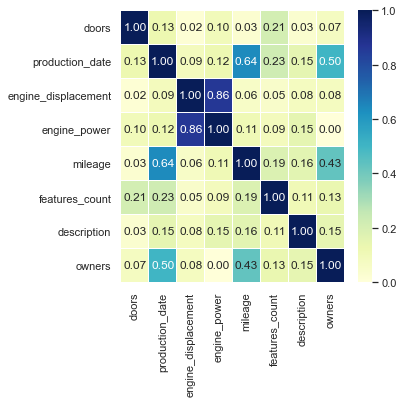

In [90]:
sns.set(font_scale=1)
fig, axis = plt.subplots(figsize=(5, 5))
sns.heatmap(data[num_columns].corr().abs(), vmin=0, vmax=1,
            annot=True, fmt=".2f", linewidths=0.1, cmap="YlGnBu")

<AxesSubplot:>

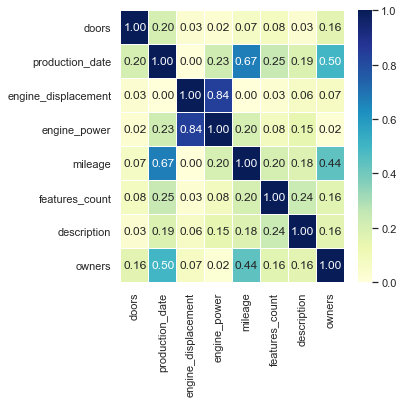

In [91]:
sns.set(font_scale=1)
fig, axis = plt.subplots(figsize=(5, 5))
sns.heatmap(data[num_columns][data["train"]==0].corr().abs(), vmin=0, vmax=1,
            annot=True, fmt=".2f", linewidths=0.1, cmap="YlGnBu")

**SUMMARY:** There are high correlation between **production_date**, **mileage**, **owners**. It makes sense as new cars have less owners and millage.   
**TODO** Apply Feature ingineering for it.

### 5.3 Variance analysis

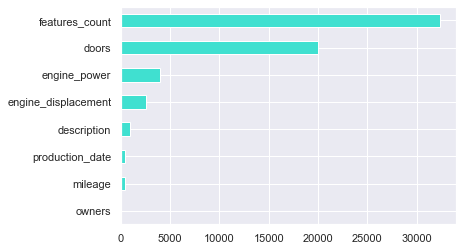

In [92]:
eda.numeric_variance_analysis(num_columns)

**SUMMARY:**  **features_count** is the most significant numeric variable.

<Figure size 432x288 with 0 Axes>

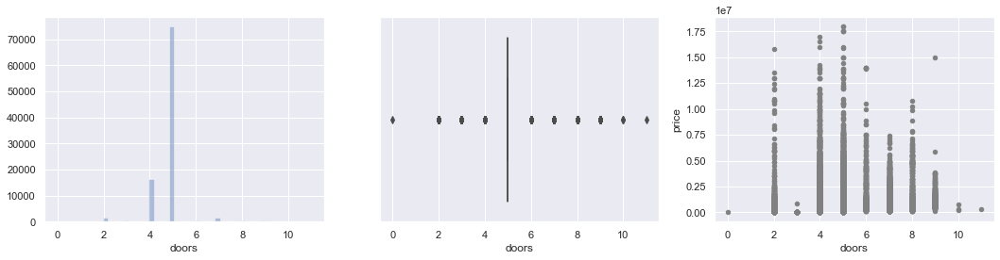

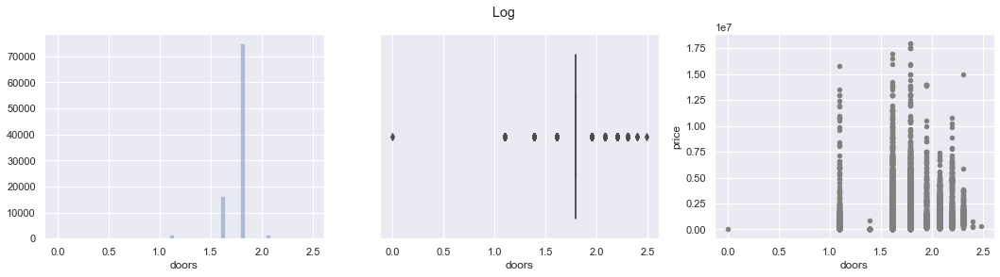

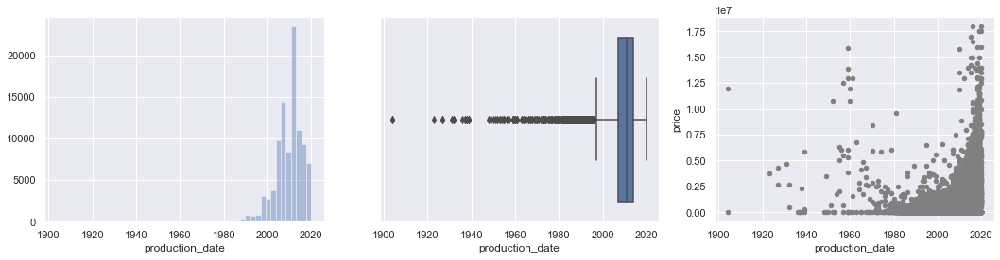

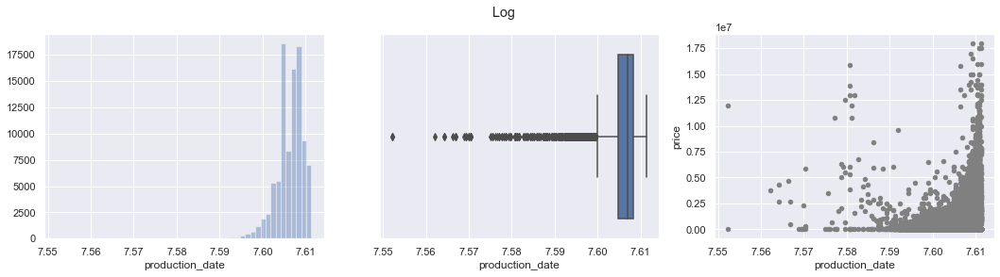

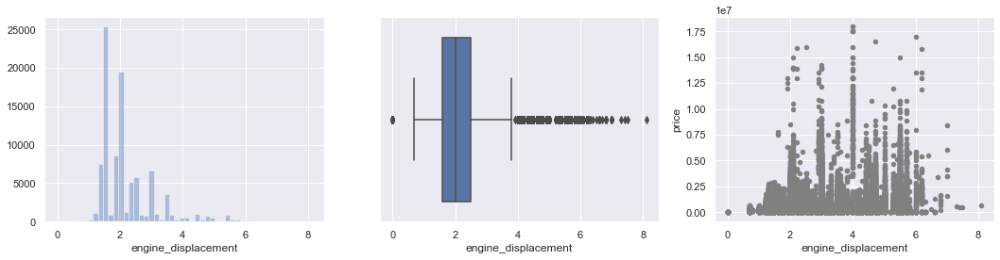

...

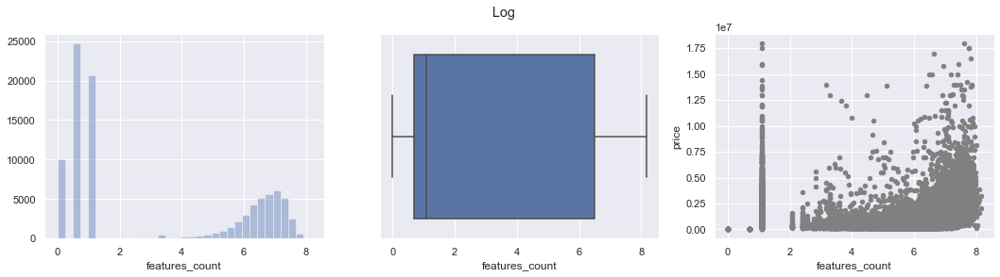

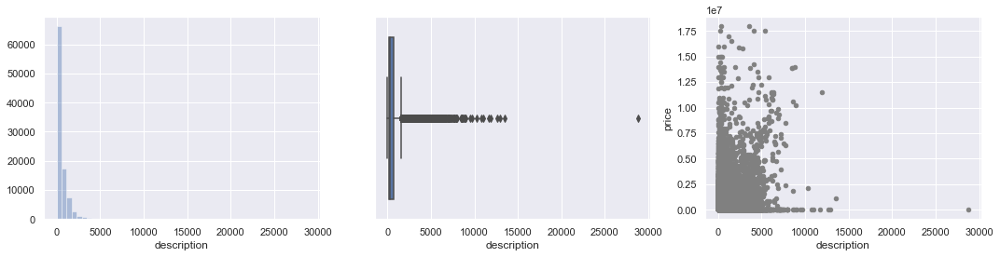

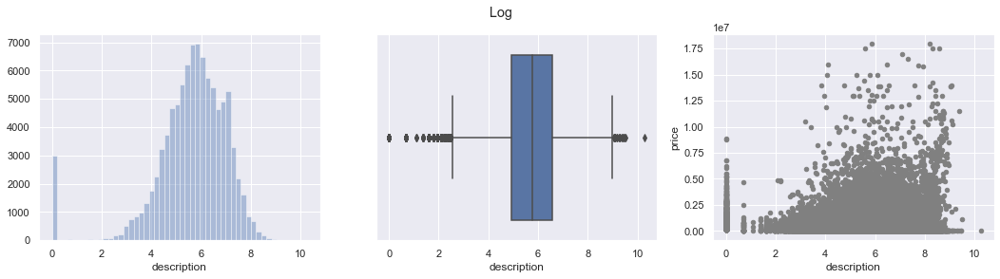

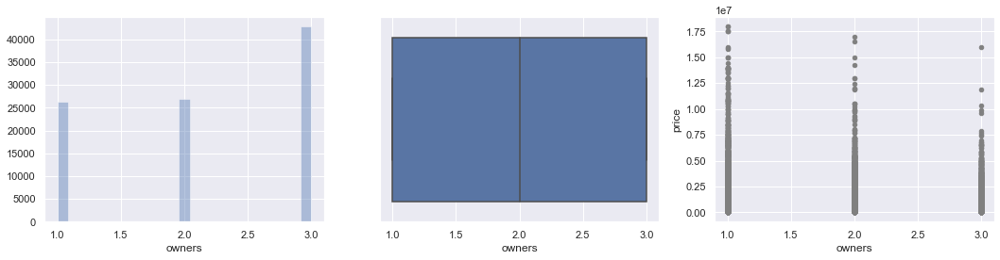

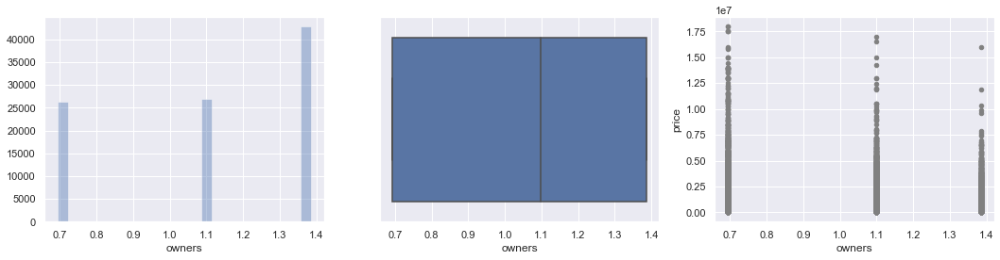

In [93]:
df = data.copy()

for col in num_columns:
    plt.suptitle('Log')
    fig, ax =plt.subplots(1,3, figsize=(18,4))
    sns.distplot(df[col].dropna(), kde = False, rug=False, ax=ax[0])
    sns.boxplot(df[col], ax=ax[1])
    df.plot(x = col, y = 'price', kind = 'scatter',color="0.5", ax=ax[2])
    fig.show()
    
    df[col] = df[col].apply(lambda w: np.log(w + 1))
    fig, ax =plt.subplots(1,3, figsize=(18,4))
    sns.distplot(df[col].dropna(), kde = False, rug=False, ax=ax[0])
    sns.boxplot(df[col], ax=ax[1])
    df.plot(x = col, y = 'price', kind = 'scatter',color="0.5", ax=ax[2])
    fig.show()

**SUMMARY:**  Log helps with **engine_displacement**, **engine_power**, **features_count**, **description**

## 6 Categorical & Binary data analysis

In [94]:
df = data.copy()
dp = DataProcessing(df)

columns = bin_columns + cat_columns;
dp.label_encode(columns)

df.sample(5)

,body,color,fuel,doors,production_date,transmission,engine_displacement,engine_power,mileage,drive_type,...,condition,owners,vehicle_title,description,price,custom,brand,sell_id,features_count,train
3830,11,11,0,5,1998.0,2,1.8,125,220255,1,...,1,3.0,1,17.0,120000,1,29,0,2,True
47180,17,7,0,5,2008.0,0,1.6,110,241000,1,...,1,2.0,0,57.0,325000,1,24,0,2,True
40331,0,1,5,5,2016.0,0,3.0,249,58000,2,...,1,3.0,1,19.0,3399000,1,22,0,2,True
50742,17,2,0,5,2005.0,2,1.5,98,172369,1,...,1,3.0,1,29.0,150000,1,24,0,2,True
9487,0,13,0,5,2014.0,1,1.8,140,100000,1,...,1,1.0,1,1563.0,698000,1,23,0,558,True


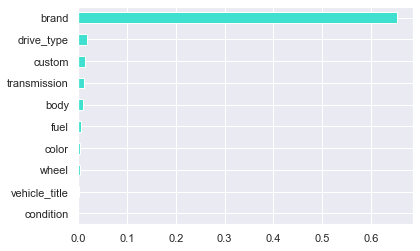

In [95]:
eda_cat = EDA(df, 'data')
eda_cat.variance_analysis(columns)

**SUMMARY:** brand is the most significant variable for categorial and binary variables.

In [96]:
data['brand'].value_counts().head(5)

kia           6603
mercedes      6500
volkswagen    6163
hyundai       6149
ford          5474
Name: brand, dtype: int64

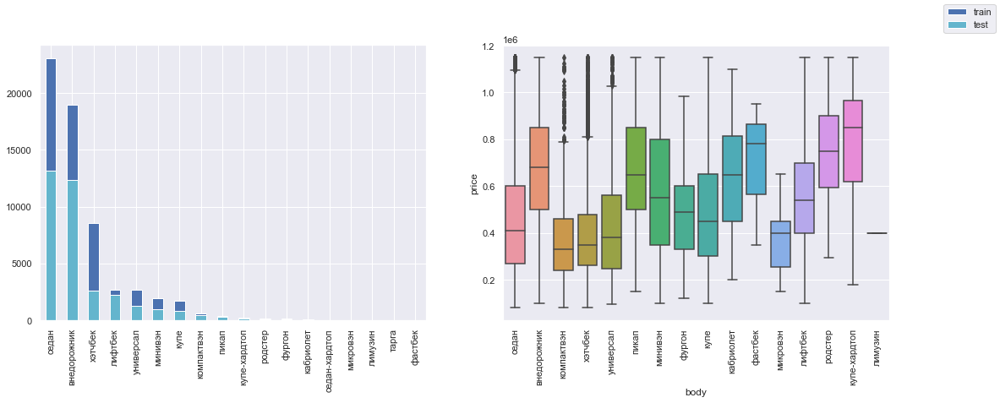

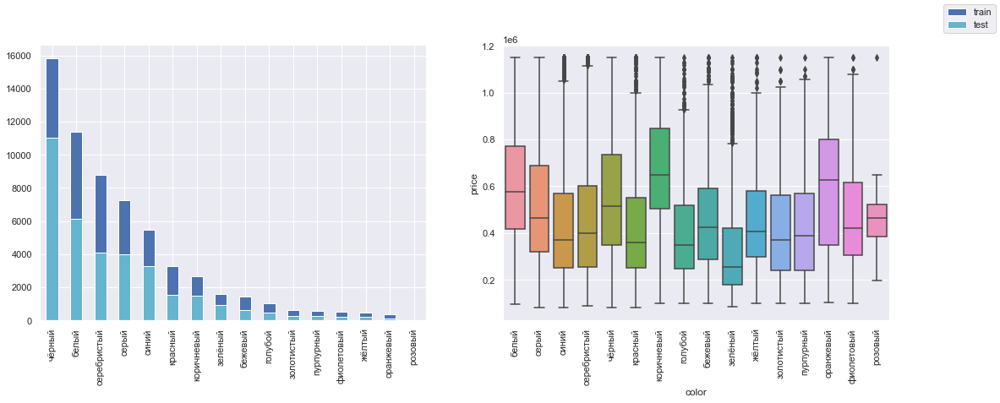

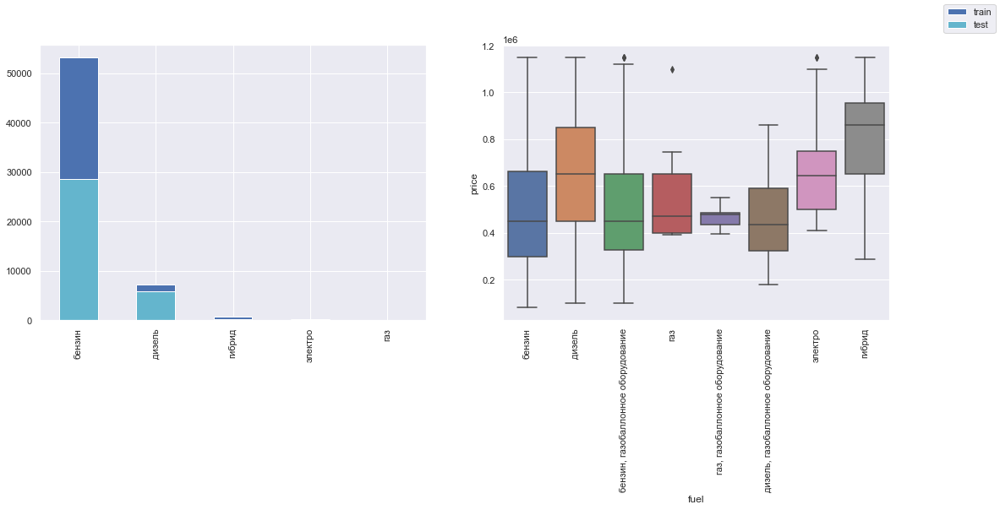

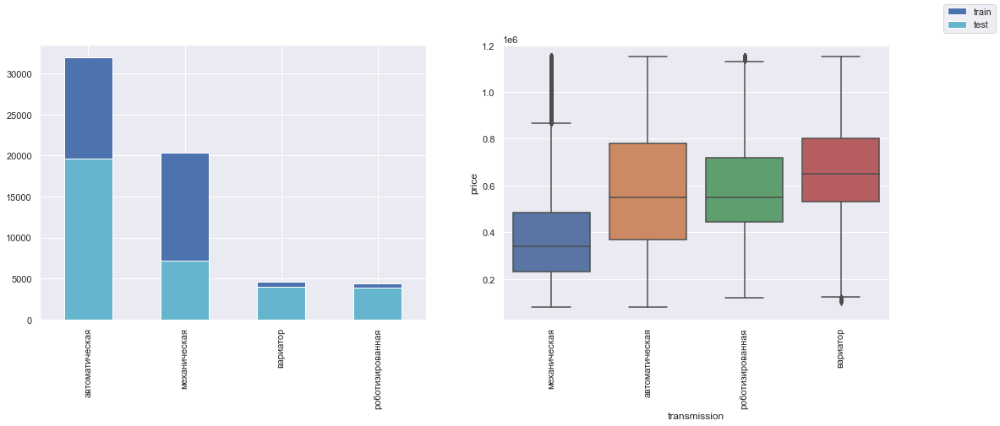

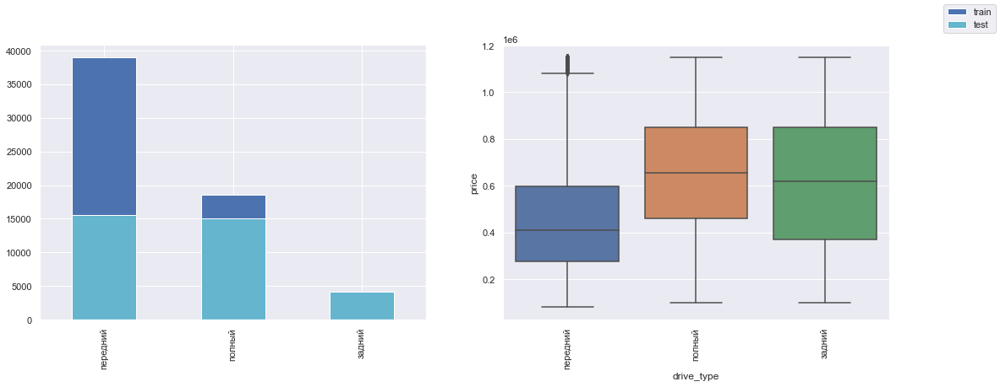

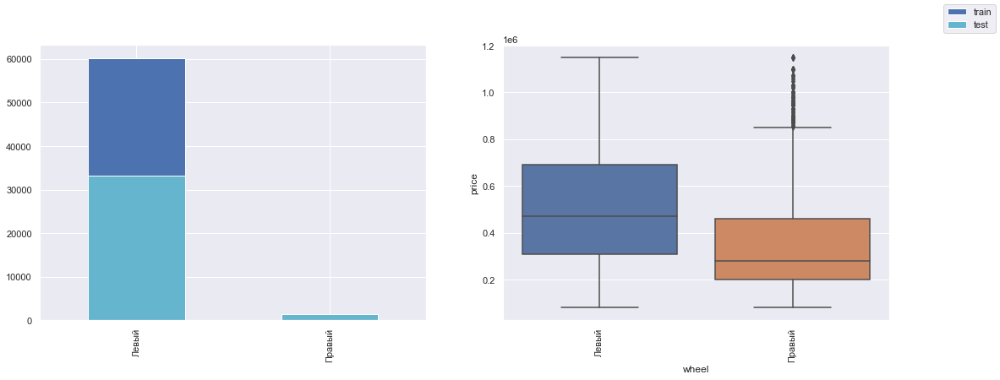

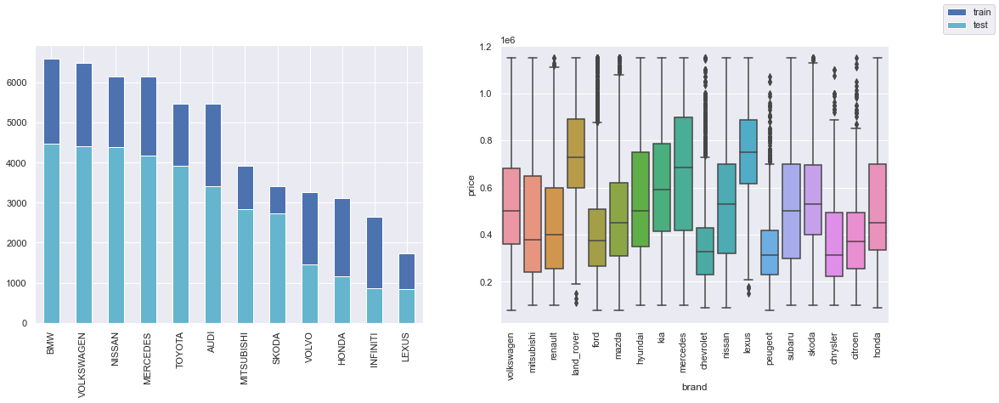

In [97]:
for col in cat_columns:
    fig, ax = plt.subplots(figsize=(18,6), ncols=2, nrows=1)
    data[data.train==1][col].value_counts().plot(kind='bar', ax=ax[0],color='b', label='train')
    data[data.train==0][col].value_counts().plot(kind='bar', ax=ax[0],color='c', label='test')
    sns.boxplot(x=col, y='price', data=data[data.train==1][data['price'] <= data['price'].quantile(0.9)], ax=ax[1])
    plt.xticks(rotation=90)
    fig.legend()
    fig.show()  

**SUMMARY:** allocation test and train categorial data very similar 

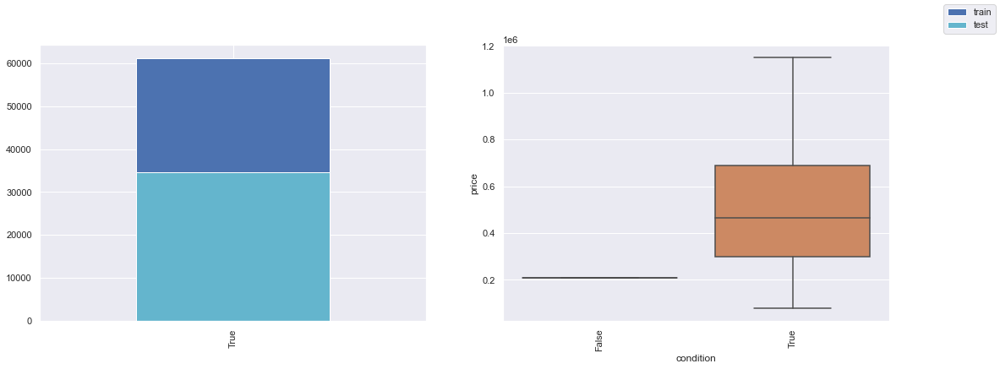

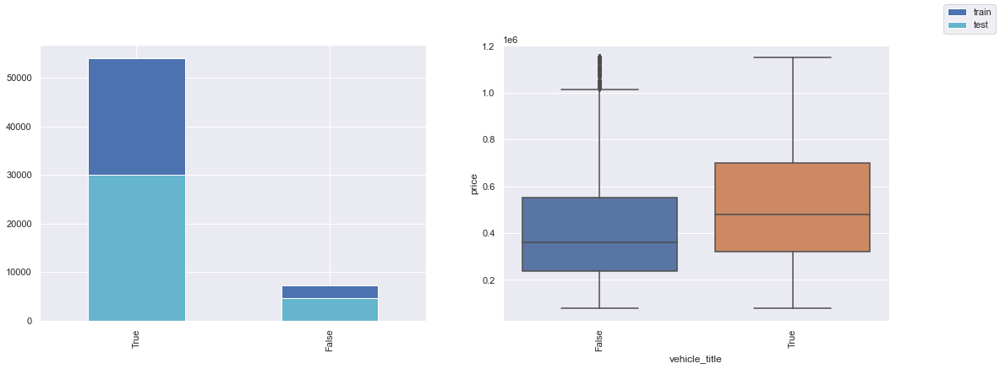

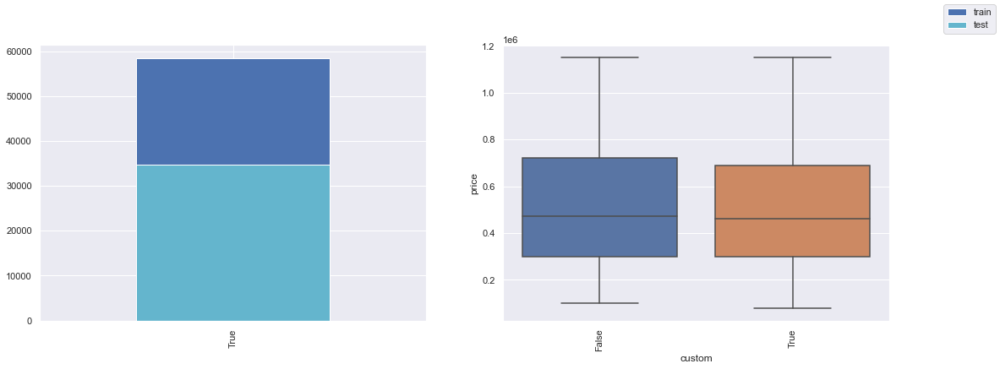

In [98]:
for col in bin_columns:
    fig, ax = plt.subplots(figsize=(18,6), ncols=2, nrows=1)
    data[data.train==1][col].value_counts().plot(kind='bar', ax=ax[0],color='b', label='train')
    data[data.train==0][col].value_counts().plot(kind='bar', ax=ax[0],color='c', label='test')
    sns.boxplot(x=col, y='price', data=data[data.train==1][data['price'] <= data['price'].quantile(0.9)], ax=ax[1])
    plt.xticks(rotation=90)
    fig.legend()
    fig.show()  

**SUMMARY:** 
1. allocation test and train categorial data very similar
2. remove **condition**, **custom** as **True** is the most presented value

## 8 Target data analysis

Text(0.5, 0, 'price, RUB * 10^7')

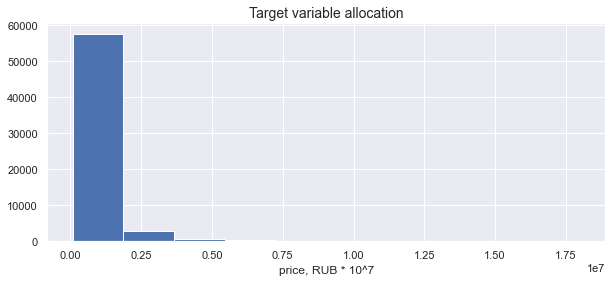

In [99]:
data[data['train']==1].price.hist(figsize=(10, 4))
plt.title('Target variable allocation', fontdict={'fontsize': 14})
plt.xlabel('price, RUB * 10^7')

Text(0.5, 1.0, 'Log target variable')

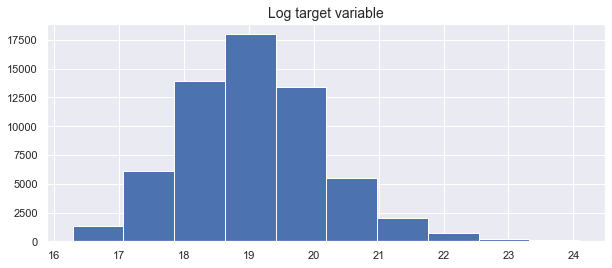

In [100]:
np.log2(data[data['train']==1].price).hist(figsize=(10, 4))
plt.title('Log target variable', fontdict={'fontsize': 14})

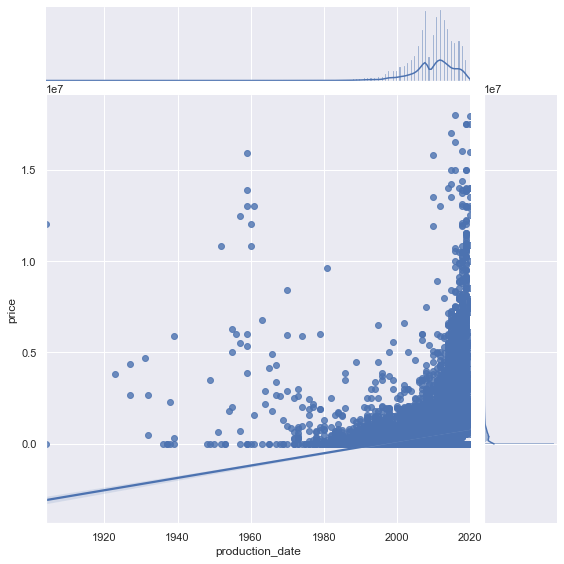

In [101]:
sns.jointplot(x='production_date', y='price', data=df, kind='reg', height=8)

## 8 Analysis Summary

### 8.1 TODO  
1. Apply log for columns: **engine_displacement**, **engine_power**, **features_count**, **description**
2. Generate new column **mileage_age_owners**
3. Apply LabelEncoding for categoria and binary columns
4. Remove **condition**, **custom** as **True** is the most presented value
5. Convert **price** from RUB to USD and log
6. Remove **engine_power** as there is high colleration with **engine_displacement** and couple other columns

In [102]:
#1. Apply log for columns: engine_displacement, engine_power, features_count, description
data['engine_displacement'] = np.log2(data['engine_displacement'] + 1)
data['engine_power'] = np.log2(data['engine_power'] + 1)
data['features_count'] = np.log2(data['features_count'] + 1)
data['description'] = np.log2(data['description'] + 1)

In [103]:
#2. Generate new column mileage_age_owners
data['mileage_age_owners'] = data['mileage'] / (2021 - data['production_date']) / data['owners']
data['mileage_age_owners'].sample(5)

30493     7407.407407
27074     5350.200000
88848     3244.444444
95845    11600.000000
86166     6976.500000
Name: mileage_age_owners, dtype: float64

In [104]:
data.drop(columns=['mileage','production_date', 'owners'], inplace=True)

<Figure size 432x288 with 0 Axes>

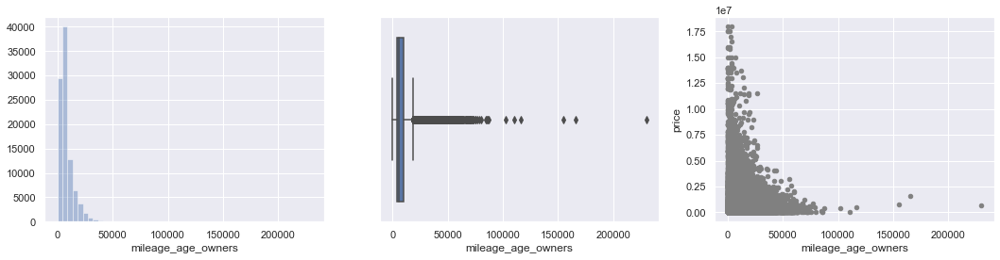

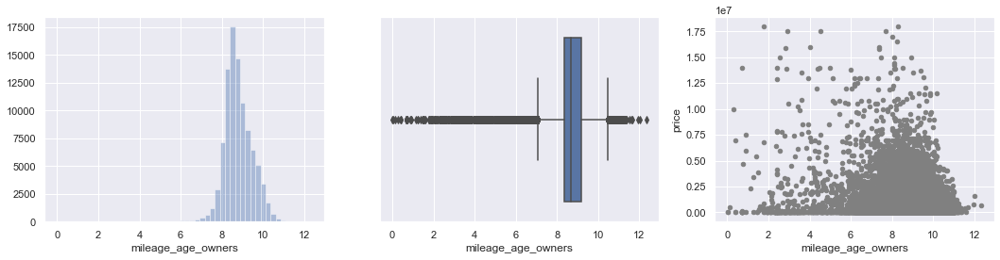

In [105]:
df = data.copy()

for col in ['mileage_age_owners']:
    plt.suptitle('Log')
    fig, ax =plt.subplots(1,3, figsize=(18,4))
    sns.distplot(df[col].dropna(), kde = False, rug=False, ax=ax[0])
    sns.boxplot(df[col], ax=ax[1])
    df.plot(x = col, y = 'price', kind = 'scatter',color="0.5", ax=ax[2])
    fig.show()
    
    df[col] = df[col].apply(lambda w: np.log(w + 1))
    fig, ax =plt.subplots(1,3, figsize=(18,4))
    sns.distplot(df[col].dropna(), kde = False, rug=False, ax=ax[0])
    sns.boxplot(df[col], ax=ax[1])
    df.plot(x = col, y = 'price', kind = 'scatter',color="0.5", ax=ax[2])
    fig.show()

In [106]:
data['mileage_age_owners'] = np.log2(data['mileage_age_owners'] + 1)

In [107]:
#3. Apply LabelEncoding for categoria and binary columns
cat_columns = ['body', 'color', 'fuel', 'transmission', 'drive_type', 'wheel', 'brand']  # categorical variables
bin_columns = ['vehicle_title'] # binary columns

columns = bin_columns + cat_columns;
dp = DataProcessing(data)
dp.label_encode(columns)

data.sample(3)

,body,color,fuel,doors,transmission,engine_displacement,engine_power,drive_type,wheel,condition,vehicle_title,description,price,custom,brand,sell_id,features_count,train,mileage_age_owners
7217,3,15,0,4,0,2.000000,7.707359,1,0,True,1,7.607330,390000,True,23,0,9.894818,True,11.011571
34710,14,0,0,5,0,1.378512,6.942515,1,0,True,1,0.000000,350000,True,18,0,7.584963,True,12.752697
60877,11,11,0,5,2,1.485427,7.139551,1,0,True,1,10.406205,410000,True,16,0,9.958553,True,12.073034


In [108]:
# 4. Remove condition, custom as True is the most presented value
data.drop(columns=['condition','custom'], inplace=True)

# 5. Convert price from RUB to USD

In [111]:
data['price'] = data.apply(lambda x: x.price if x.price > 0 else x.price * RUB_USD_RATE, axis=1)

In [112]:
data['price'] = np.log2(data['price'] + 1)

In [113]:
# 6. Remove **engine_power** as there is high colleration with **engine_displacement** and couple other columns
data.drop(columns=['engine_power'], inplace=True)
data.sample(5)

,body,color,fuel,doors,transmission,engine_displacement,drive_type,wheel,vehicle_title,description,price,brand,sell_id,features_count,train,mileage_age_owners
78387,8,13,5,4,2,1.678072,1,0,1,5.209453,0.000000,5,1094748688,0.000000,False,11.448157
20114,17,7,0,5,2,1.378512,1,0,0,9.831307,17.931574,21,0,9.769838,True,11.973638
44507,3,7,0,5,2,1.678072,1,0,0,5.169925,16.811287,12,0,1.584963,True,10.275071
94619,0,12,0,5,0,2.510962,2,0,1,8.044394,0.000000,9,1096448690,1.000000,False,13.534749
21420,0,1,0,5,0,1.807355,1,0,1,8.703904,19.697105,21,0,1.584963,True,13.800415


### 8.2 Secondary Analysis 

In [114]:
eda = EDA(data, 'data')
eda.primary_analysis()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 9 Trainings

###  Prepare datasets

In [115]:
data.sample(3)

,body,color,fuel,doors,transmission,engine_displacement,drive_type,wheel,vehicle_title,description,price,brand,sell_id,features_count,train,mileage_age_owners
6686,11,15,0,5,2,1.378512,1,0,1,9.634811,17.497174,23,0,9.219169,True,12.764733
41719,0,13,0,5,0,2.321928,2,0,1,7.055282,22.573808,22,0,10.340963,True,11.299323
22982,17,7,0,5,2,1.263034,1,0,0,0.000000,18.241913,17,0,1.584963,True,12.925328


In [118]:
cols_to_delete = ['price','sell_id']

X = data[data['train'] == 1].drop(cols_to_delete, axis=1).reset_index(drop=True)
X_sub = data[data['train'] == 0].drop(cols_to_delete, axis=1)
y = data[data['train'] == 1].price.reset_index(drop=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, shuffle=True, random_state=RANDOM_SEED)

### 9.1 CatBoostRegressor

In [119]:
model = CatBoostRegressor(iterations=5000,
                          random_seed=RANDOM_SEED,
                          eval_metric='MAPE',
                          custom_metric=['R2', 'MAE'],
                          silent=True
                          )

model.fit(X_train, y_train, eval_set=(X_test, y_test), verbose_eval=0, use_best_model=True)
y_pred = model.predict(X_test)

In [120]:
mape(y_test, y_pred)

Model Accuracy: MAPE: 2.01%


### 9.2 DecisionTreeRegressor

In [123]:
model = DecisionTreeRegressor(random_state=RANDOM_SEED)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [124]:
mape(y_test, y_pred)

Model Accuracy: MAPE: 2.88%


**RESULT**: a bit worse than **CatBoostRegressor**

### 9.3 RandomForestRegressor

In [125]:
model = RandomForestRegressor(random_state=RANDOM_SEED)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [126]:
mape(y_test, y_pred)

Model Accuracy: MAPE: 2.11%


**RESULT**: a bit worse than **CatBoostRegressor**

### 9.4  RandomForestRegressor with Hyper parameters

In [127]:
n_estimators = [100, 150, 200, 250, 300, 350, 400]
max_features = ['auto', 'sqrt']
max_depth = [10, 15, 20, 25]
max_depth.append(None)
min_samples_split = [2, 4, 6, 8, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}


model_random = RandomizedSearchCV(estimator=model, param_distributions=random_grid, n_iter=10, 
                               cv=3, verbose=2, random_state=42, n_jobs=-1)
model_random.fit(X_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits


RandomizedSearchCV(cv=3, estimator=RandomForestRegressor(random_state=42),
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [10, 15, 20, 25, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 4, 6, 8, 10],
                                        'n_estimators': [100, 150, 200, 250,
                                                         300, 350, 400]},
                   random_state=42, verbose=2)

In [128]:
model_random.best_params_

{'n_estimators': 100,
 'min_samples_split': 10,
 'min_samples_leaf': 2,
 'max_features': 'sqrt',
 'max_depth': 20,
 'bootstrap': False}

In [129]:
model = RandomForestRegressor(random_state=RANDOM_SEED, n_jobs=-1,verbose=1, n_estimators=100,
                             min_samples_split=10, min_samples_leaf=2, max_features='sqrt',
                             max_depth=20, bootstrap=False)
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    2.0s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.0s finished


In [130]:
mape(y_test, y_pred)

Model Accuracy: MAPE: 2.11%


**RESULT**: a bit worse than **CatBoostRegressor**

### 9.5 ExtraTreesRegressor

In [131]:
model = ExtraTreesRegressor(random_state=RANDOM_SEED)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [132]:
mape(y_test, y_pred)

Model Accuracy: MAPE: 2.02%


**RESULT**: very close to **CatBoostRegressor**

### 9.6 AdaBoostRegressor

In [133]:
model = AdaBoostRegressor(random_state=RANDOM_SEED)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [134]:
mape(y_test, y_pred)

Model Accuracy: MAPE: 3.25%


**RESULT**: much worse than **CatBoostRegressor**

### 9.7 GradientBoosting

In [135]:
model = GradientBoostingRegressor(random_state=RANDOM_SEED)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [136]:
mape(y_test, y_pred)

Model Accuracy: MAPE: 2.51%


**RESULT**: a worse than **CatBoostRegressor**

### 9.8 BaggingRegressor

In [137]:
model = BaggingRegressor(random_state=RANDOM_SEED)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [138]:
mape(y_test, y_pred)

Model Accuracy: MAPE: 2.22%


**RESULT**: a worse than **CatBoostRegressor**

### 9.9 Stacking

In [141]:
estimators = [
    ('etr', ExtraTreesRegressor(random_state=RANDOM_SEED, n_jobs=-1, verbose=1)),
    ('bagr', BaggingRegressor(random_state=RANDOM_SEED)),
    ('cfr', RandomForestRegressor(random_state=RANDOM_SEED))
]

stack_log = StackingRegressor(estimators=estimators,
                              final_estimator=LinearRegression()
                              )

stack_log.fit(X_train, np.log(y_train))
y_pred = np.exp(stack_log.predict(X_test))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.9s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    4.5s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  76 tasks      | elapsed:    3.0s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:    3.8s finished
[Parallel(n_jobs=4)]: Using backend ThreadingBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  42 tasks      | elapsed:    0.0s
[Parallel(n_jobs=4)]:

In [142]:
mape(y_test, y_pred)

Model Accuracy: MAPE: 2.01%


**RESULT**: equals to **CatBoostRegressor**

## 10 Submission

In [143]:
# The best result
model = CatBoostRegressor(iterations=5000,
                          random_seed=RANDOM_SEED,
                          eval_metric='MAPE',
                          custom_metric=['R2', 'MAE'],
                          silent=True
                          )

model.fit(X_train, y_train, eval_set=(X_test, y_test), verbose_eval=0, use_best_model=True)
y_pred = model.predict(X_test)
y_pred

array([17.72248041, 19.83872006, 19.29842581, ..., 19.47840453,
       17.85275392, 19.0003677 ])

In [148]:
predict_submission = np.exp(model.predict(X_sub))
predict_submission2 = np.exp(predict_submission) 
predict_submission2 = predict_submission2/RUB_USD_RATE
predict_submission2.min(), predict_submission2.max()
#submission['price'] = predict_submission

(19992166.93850553, 30439673461.268764)

In [355]:
data_sample_submission.sample(5)

,sell_id,price
28560,1101265579,18.987756
9655,1100329884,18.829260
20848,1100490270,19.680859
15208,1090405302,18.966134
12065,1096922866,20.285703


In [356]:
data_sample_submission.shape

(34686, 2)

In [357]:
# save submission to file 
data_sample_submission.to_csv(DATA_DIR + 'submission.csv', index=False)